In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds

#Descargar el set de datos de perros y gatos
datos, metadatos = tfds.load('cats_vs_dogs', as_supervised=True, with_info=True)
setattr(tfds.image_classification.cats_vs_dogs, '_URL',"https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip")

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Shuffling ~/tensorflow_datasets/cats_vs_dogs/4.0.0.incomplete03YL7Q/cats_vs_dogs-train.tfrecord*...:   0%|    …

Dataset cats_vs_dogs downloaded and prepared to ~/tensorflow_datasets/cats_vs_dogs/4.0.0. Subsequent calls will reuse this data.


In [ ]:
#Imprimir los metadatos para revisarlos
metadatos

tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    full_name='cats_vs_dogs/4.0.0',
    description="""
    A large set of images of cats and dogs. There are 1738 corrupted images that are dropped.
    """,
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    data_path='~/tensorflow_datasets/cats_vs_dogs/4.0.0',
    file_format=tfrecord,
    download_size=786.67 MiB,
    dataset_size=689.64 MiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/filename': Text(shape=(), dtype=tf.string),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=23262, num_shards=8>,
    },
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and

,image,label
0,,1 (dog)
1,,1 (dog)
2,,1 (dog)
3,,0 (cat)
4,,1 (dog)

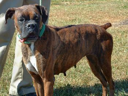
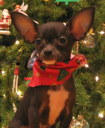
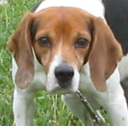
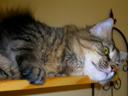
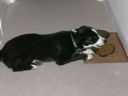

In [ ]:
#Una forma de mostrar 5 ejemplos del set
tfds.as_dataframe(datos['train'].take(5), metadatos)

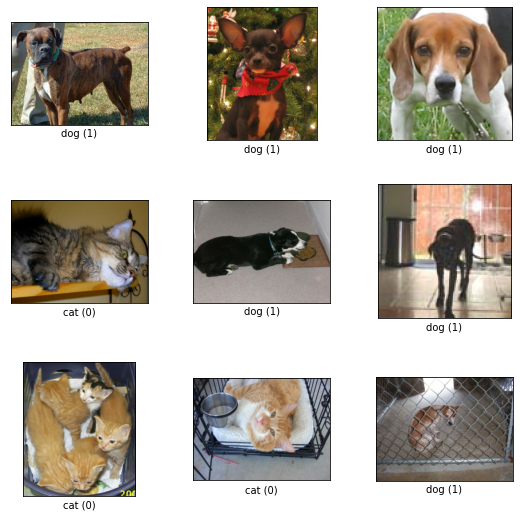

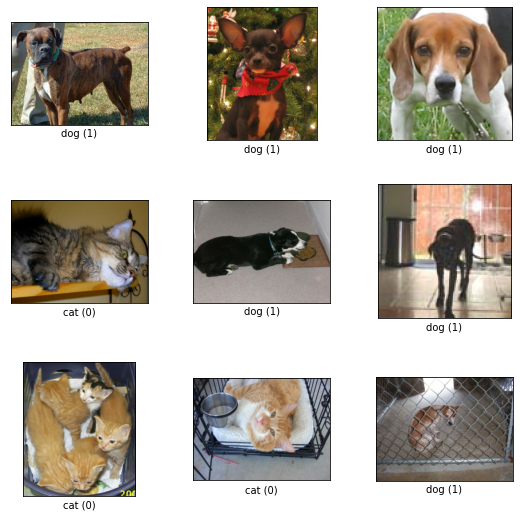

In [ ]:
#Otra forma de mostrar ejemplos del set
tfds.show_examples(datos['train'], metadatos)

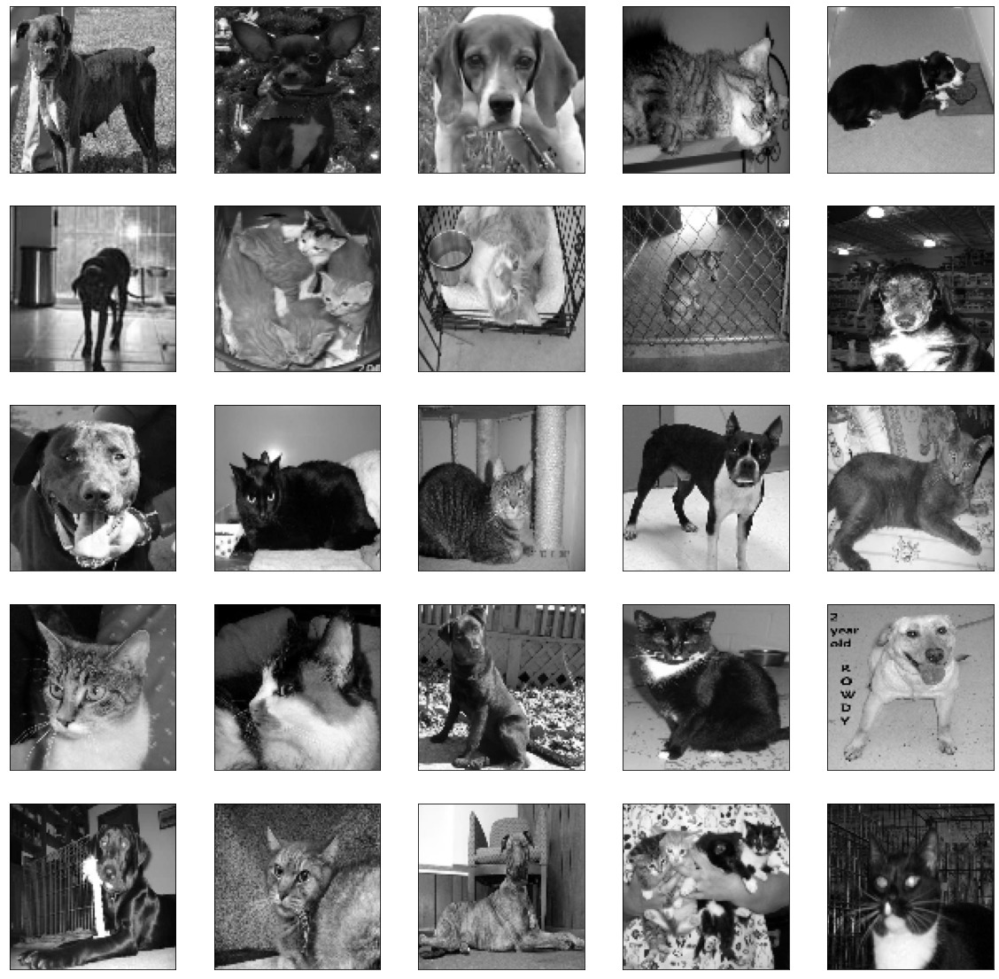

In [ ]:
#Manipular y visualizar el set
#Lo pasamos a TAMANO_IMG (100x100) y a blanco y negro (solo para visualizar)
import matplotlib.pyplot as plt
import cv2

plt.figure(figsize=(20,20))

TAMANO_IMG=100

for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  plt.subplot(5, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(imagen, cmap='gray')

In [ ]:
#Variable que contendra todos los pares de los datos (imagen y etiqueta) ya modificados (blanco y negro, 100x100)
datos_entrenamiento = []

In [ ]:
for i, (imagen, etiqueta) in enumerate(datos['train']): #Todos los datos
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  imagen = imagen.reshape(TAMANO_IMG, TAMANO_IMG, 1) #Cambiar tamano a 100,100,1
  datos_entrenamiento.append([imagen, etiqueta])

In [ ]:
#Ver los datos del primer indice
datos_entrenamiento[0]

[array([[[242],
         [190],
         [105],
         ...,
         [189],
         [195],
         [143]],
 
        [[230],
         [130],
         [ 88],
         ...,
         [188],
         [179],
         [187]],
 
        [[170],
         [ 93],
         [ 84],
         ...,
         [131],
         [158],
         [168]],
 
        ...,
 
        [[112],
         [173],
         [164],
         ...,
         [141],
         [152],
         [119]],
 
        [[140],
         [151],
         [172],
         ...,
         [ 96],
         [150],
         [152]],
 
        [[ 92],
         [112],
         [168],
         ...,
         [ 44],
         [ 52],
         [ 47]]], dtype=uint8), <tf.Tensor: shape=(), dtype=int64, numpy=1>]

In [ ]:
#Ver cuantos datos tengo en la variable
len(datos_entrenamiento)

23262

In [ ]:
#Preparar mis variables X (entradas) y y (etiquetas) separadas

X = [] #imagenes de entrada (pixeles)
y = [] #etiquetas (perro o gato)

for imagen, etiqueta in datos_entrenamiento:
  X.append(imagen)
  y.append(etiqueta)

In [ ]:
X

array([[[[0.94901961],
         [0.74509804],
         [0.41176471],
         ...,
         [0.74117647],
         [0.76470588],
         [0.56078431]],

        [[0.90196078],
         [0.50980392],
         [0.34509804],
         ...,
         [0.7372549 ],
         [0.70196078],
         [0.73333333]],

        [[0.66666667],
         [0.36470588],
         [0.32941176],
         ...,
         [0.51372549],
         [0.61960784],
         [0.65882353]],

        ...,

        [[0.43921569],
         [0.67843137],
         [0.64313725],
         ...,
         [0.55294118],
         [0.59607843],
         [0.46666667]],

        [[0.54901961],
         [0.59215686],
         [0.6745098 ],
         ...,
         [0.37647059],
         [0.58823529],
         [0.59607843]],

        [[0.36078431],
         [0.43921569],
         [0.65882353],
         ...,
         [0.17254902],
         [0.20392157],
         [0.18431373]]],


       [[[0.57254902],
         [0.45098039],
         [0.36

In [ ]:
#Normalizar los datos de las X (imagenes). Se pasan a numero flotante y dividen entre 255 para quedar de 0-1 en lugar de 0-255
import numpy as np

X = np.array(X).astype(float) / 255

In [ ]:
y

array([1, 1, 1, ..., 0, 1, 0])

In [ ]:
#Convertir etiquetas en arreglo simple
y = np.array(y)

In [ ]:
X.shape

(23262, 100, 100, 1)

In [ ]:
#Crear los modelos iniciales
#Usan sigmoid como salida (en lugar de softmax) para mostrar como podria funcionar con dicha funcion de activacion.
#Sigmoid regresa siempre datos entre 0 y 1. Realizamos el entrenamiento para al final considerar que si la respuesta se
#acerca a 0, es un gato, y si se acerca a 1, es un perro.

modeloDenso = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(100, 100, 1)),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(100, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN2 = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Dropout(0.5),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(250, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
#Compilar modelos. Usar crossentropy binario ya que tenemos solo 2 opciones (perro o gato)
modeloDenso.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN2.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [ ]:
from tensorflow.keras.callbacks import TensorBoard

In [ ]:
#La variable de tensorboard se envia en el arreglo de "callbacks" (hay otros tipos de callbacks soportados)
#En este caso guarda datos en la carpeta indicada en cada epoca, de manera que despues
#Tensorboard los lee para hacer graficas
tensorboardDenso = TensorBoard(log_dir='logs/denso')
modeloDenso.fit(X, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardDenso])

Epoch 1/100
618/618 [==============================] - 6s 5ms/step - loss: 0.7080 - accuracy: 0.5455 - val_loss: 0.6845 - val_accuracy: 0.5507
Epoch 2/100
618/618 [==============================] - 2s 4ms/step - loss: 0.6794 - accuracy: 0.5701 - val_loss: 0.6685 - val_accuracy: 0.5971
Epoch 3/100
618/618 [==============================] - 3s 4ms/step - loss: 0.6688 - accuracy: 0.5922 - val_loss: 0.6687 - val_accuracy: 0.5874
Epoch 4/100
618/618 [==============================] - 3s 4ms/step - loss: 0.6660 - accuracy: 0.5949 - val_loss: 0.6694 - val_accuracy: 0.5940
Epoch 5/100
618/618 [==============================] - 3s 4ms/step - loss: 0.6625 - accuracy: 0.6010 - val_loss: 0.6794 - val_accuracy: 0.5719
Epoch 6/100
618/618 [==============================] - 2s 4ms/step - loss: 0.6643 - accuracy: 0.5963 - val_loss: 0.6681 - val_accuracy: 0.5903
Epoch 7/100
618/618 [==============================] - 3s 4ms/step - loss: 0.6618 - accuracy: 0.6060 - val_loss: 0.6711 - val_accuracy: 0.5871

In [ ]:
#Cargar la extension de tensorboard de colab
%load_ext tensorboard

In [ ]:
#Ejecutar tensorboard e indicarle que lea la carpeta "logs"
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
tensorboardCNN = TensorBoard(log_dir='logs/cnn')
modeloCNN.fit(X, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardCNN])

Epoch 1/100
618/618 [==============================] - 19s 15ms/step - loss: 0.6101 - accuracy: 0.6630 - val_loss: 0.5794 - val_accuracy: 0.6963
Epoch 2/100
618/618 [==============================] - 9s 14ms/step - loss: 0.4831 - accuracy: 0.7666 - val_loss: 0.4487 - val_accuracy: 0.7862
Epoch 3/100
618/618 [==============================] - 9s 14ms/step - loss: 0.4182 - accuracy: 0.8060 - val_loss: 0.4054 - val_accuracy: 0.8115
Epoch 4/100
618/618 [==============================] - 9s 15ms/step - loss: 0.3651 - accuracy: 0.8347 - val_loss: 0.3766 - val_accuracy: 0.8318
Epoch 5/100
618/618 [==============================] - 9s 15ms/step - loss: 0.3147 - accuracy: 0.8616 - val_loss: 0.4092 - val_accuracy: 0.8120
Epoch 6/100
618/618 [==============================] - 9s 14ms/step - loss: 0.2629 - accuracy: 0.8877 - val_loss: 0.3771 - val_accuracy: 0.8361
Epoch 7/100
618/618 [==============================] - 9s 14ms/step - loss: 0.2139 - accuracy: 0.9104 - val_loss: 0.4588 - val_accuracy

In [ ]:
tensorboardCNN2 = TensorBoard(log_dir='logs/cnn2')
modeloCNN2.fit(X, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardCNN2])

Epoch 1/100
618/618 [==============================] - 11s 17ms/step - loss: 0.6254 - accuracy: 0.6403 - val_loss: 0.5527 - val_accuracy: 0.7123
Epoch 2/100
618/618 [==============================] - 10s 16ms/step - loss: 0.5005 - accuracy: 0.7564 - val_loss: 0.4501 - val_accuracy: 0.7822
Epoch 3/100
618/618 [==============================] - 9s 15ms/step - loss: 0.4367 - accuracy: 0.7989 - val_loss: 0.4429 - val_accuracy: 0.7888
Epoch 4/100
618/618 [==============================] - 9s 15ms/step - loss: 0.3944 - accuracy: 0.8221 - val_loss: 0.3883 - val_accuracy: 0.8269
Epoch 5/100
618/618 [==============================] - 9s 15ms/step - loss: 0.3520 - accuracy: 0.8456 - val_loss: 0.3703 - val_accuracy: 0.8367
Epoch 6/100
618/618 [==============================] - 9s 15ms/step - loss: 0.3095 - accuracy: 0.8662 - val_loss: 0.3618 - val_accuracy: 0.8350
Epoch 7/100
618/618 [==============================] - 10s 16ms/step - loss: 0.2711 - accuracy: 0.8866 - val_loss: 0.3373 - val_accura

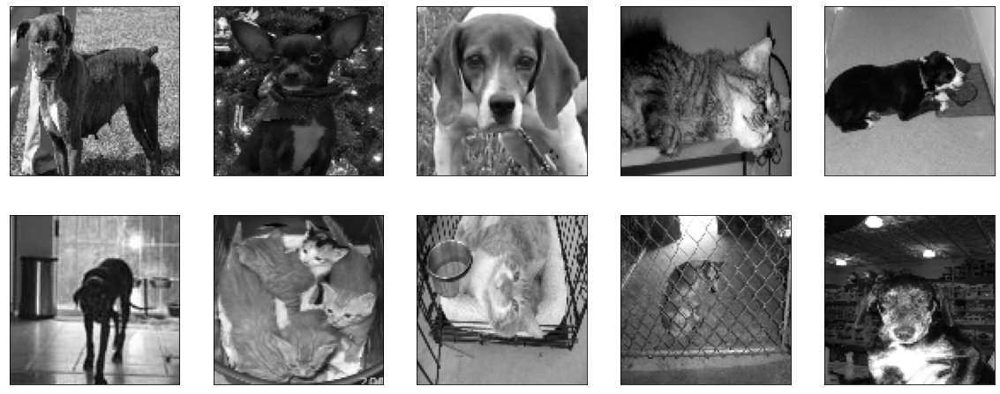

In [ ]:
#ver las imagenes de la variable X sin modificaciones por aumento de datos
plt.figure(figsize=(20, 8))
for i in range(10):
  plt.subplot(2, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(X[i].reshape(100, 100), cmap="gray")

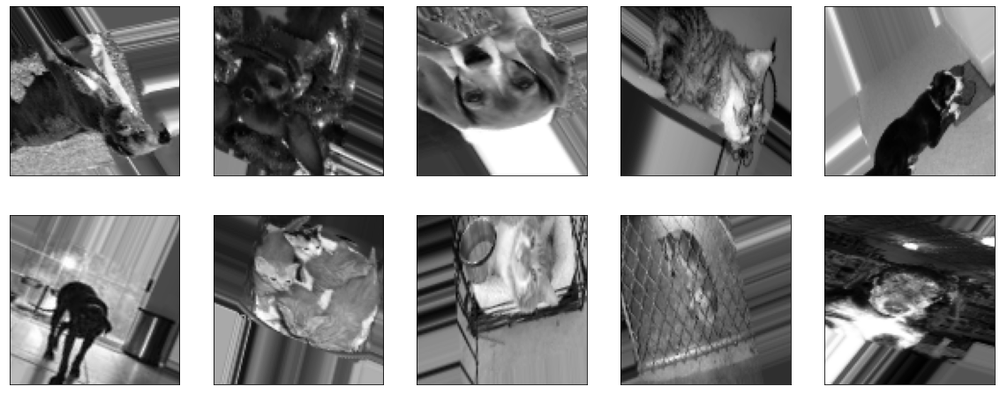

In [ ]:
#Realizar el aumento de datos con varias transformaciones. Al final, graficar 10 como ejemplo
#Importar el generador con aumento de datos
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=15,
    zoom_range=[0.7, 1.4],
    horizontal_flip=True,
    vertical_flip=True
)

datagen.fit(X)

plt.figure(figsize=(20,8))

for imagen, etiqueta in datagen.flow(X, y, batch_size=10, shuffle=False):
  for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen[i].reshape(100, 100), cmap="gray")
  break

In [ ]:
modeloDenso_AD = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(100, 100, 1)),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN_AD = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(100, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN2_AD = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Dropout(0.5),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(250, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
modeloDenso_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN2_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [ ]:
#Separar los datos de entrenamiento y los datos de pruebas en variables diferentes

len(X) * .85 #19700
len(X) - 19700 #3562

X_entrenamiento = X[:19700] #85%
X_validacion = X[19700:]  #15%

y_entrenamiento = y[:19700]
y_validacion = y[19700:]

In [ ]:
import gc
gc.collect()

33264

In [ ]:
#Usar la funcion flow del generador para crear un iterador que podamos enviar como entrenamiento a la funcion FIT del modelo
data_gen_entrenamiento = datagen.flow(X_entrenamiento, y_entrenamiento, batch_size=32)

In [ ]:
tensorboardDenso_AD = TensorBoard(log_dir='logs/denso_AD')

modeloDenso_AD.fit(
    data_gen_entrenamiento,
    epochs=100, batch_size=32,
    validation_data=(X_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardDenso_AD]
)

Epoch 1/100
616/616 [==============================] - 20s 31ms/step - loss: 0.7235 - accuracy: 0.5061 - val_loss: 0.6922 - val_accuracy: 0.5312
Epoch 2/100
616/616 [==============================] - 18s 29ms/step - loss: 0.6916 - accuracy: 0.5258 - val_loss: 0.6899 - val_accuracy: 0.5323
Epoch 3/100
616/616 [==============================] - 17s 28ms/step - loss: 0.6925 - accuracy: 0.5143 - val_loss: 0.6922 - val_accuracy: 0.5087
Epoch 4/100
616/616 [==============================] - 17s 28ms/step - loss: 0.6917 - accuracy: 0.5263 - val_loss: 0.6917 - val_accuracy: 0.5020
Epoch 5/100
616/616 [==============================] - 17s 28ms/step - loss: 0.6924 - accuracy: 0.5047 - val_loss: 0.6915 - val_accuracy: 0.5118
Epoch 6/100
616/616 [==============================] - 17s 28ms/step - loss: 0.6930 - accuracy: 0.4998 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 7/100
616/616 [==============================] - 18s 29ms/step - loss: 0.6937 - accuracy: 0.5064 - val_loss: 0.6921 - val_ac

In [ ]:
tensorboardCNN_AD = TensorBoard(log_dir='logs-new/cnn_AD')

modeloCNN_AD.fit(
    data_gen_entrenamiento,
    epochs=150, batch_size=32,
    validation_data=(X_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardCNN_AD]
)

Epoch 1/150
616/616 [==============================] - 22s 35ms/step - loss: 0.6869 - accuracy: 0.5410 - val_loss: 0.6846 - val_accuracy: 0.5536
Epoch 2/150
616/616 [==============================] - 20s 33ms/step - loss: 0.6791 - accuracy: 0.5713 - val_loss: 0.6656 - val_accuracy: 0.6008
Epoch 3/150
616/616 [==============================] - 21s 34ms/step - loss: 0.6658 - accuracy: 0.5980 - val_loss: 0.6574 - val_accuracy: 0.6030
Epoch 4/150
616/616 [==============================] - 20s 33ms/step - loss: 0.6467 - accuracy: 0.6269 - val_loss: 0.6195 - val_accuracy: 0.6502
Epoch 5/150
616/616 [==============================] - 21s 34ms/step - loss: 0.6336 - accuracy: 0.6408 - val_loss: 0.6087 - val_accuracy: 0.6659
Epoch 6/150
616/616 [==============================] - 21s 34ms/step - loss: 0.6193 - accuracy: 0.6580 - val_loss: 0.5657 - val_accuracy: 0.7010
Epoch 7/150
616/616 [==============================] - 20s 33ms/step - loss: 0.6091 - accuracy: 0.6656 - val_loss: 0.5605 - val_ac

In [ ]:
tensorboardCNN2_AD = TensorBoard(log_dir='logs/cnn2_AD')

modeloCNN2_AD.fit(
    data_gen_entrenamiento,
    epochs=100, batch_size=32,
    validation_data=(X_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardCNN2_AD]
)

Epoch 1/100
616/616 [==============================] - 22s 35ms/step - loss: 0.6835 - accuracy: 0.5544 - val_loss: 0.6708 - val_accuracy: 0.5660
Epoch 2/100
616/616 [==============================] - 20s 33ms/step - loss: 0.6634 - accuracy: 0.6027 - val_loss: 0.6869 - val_accuracy: 0.5794
Epoch 3/100
616/616 [==============================] - 20s 32ms/step - loss: 0.6481 - accuracy: 0.6302 - val_loss: 0.7195 - val_accuracy: 0.5567
Epoch 4/100
616/616 [==============================] - 20s 32ms/step - loss: 0.6360 - accuracy: 0.6365 - val_loss: 0.6186 - val_accuracy: 0.6648
Epoch 5/100
616/616 [==============================] - 20s 32ms/step - loss: 0.6306 - accuracy: 0.6483 - val_loss: 0.5791 - val_accuracy: 0.6940
Epoch 6/100
616/616 [==============================] - 21s 34ms/step - loss: 0.6205 - accuracy: 0.6578 - val_loss: 0.5902 - val_accuracy: 0.6715
Epoch 7/100
616/616 [==============================] - 20s 32ms/step - loss: 0.6122 - accuracy: 0.6661 - val_loss: 0.5621 - val_ac

In [ ]:
modeloCNN_AD.save('perros-gatos-cnn-ad.h5')

In [ ]:
!pip install tensorflowjs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 81 kB 8.1 MB/s 
     |████████████████████████████████| 40 kB 6.2 MB/s 
     |████████████████████████████████| 185 kB 69.3 MB/s 
     |████████████████████████████████| 237 kB 71.7 MB/s 
     |████████████████████████████████| 145 kB 90.3 MB/s 
     |████████████████████████████████| 51 kB 7.6 MB/s 
     |████████████████████████████████| 85 kB 4.4 MB/s 
  Attempting uninstall: packaging
    Found existing installation: packaging 21.3
    Uninstalling packaging-21.3:
      Successfully uninstalled packaging-21.3


In [ ]:
!mkdir carpeta_salida

In [ ]:
!tensorflowjs_converter --input_format keras perros-gatos-cnn-ad.h5 carpeta_salida